# Analysis of Binding Patterns (Yogi's Dataset)

## Purpose: 
{TODO}

## Packages and Options

In [1]:
%load_ext autoreload 
%autoreload 2

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import polars as pl 
_=pl.Config.set_tbl_cols(100000)
_=pl.Config.set_tbl_rows(10000)
_=pl.Config.set_tbl_width_chars(10000)
_=pl.Config.set_fmt_str_lengths(10000)

import pandas as pd
pd.set_option('display.max_rows', 1000000)
pd.set_option('display.max_columns', 1000000)
pd.set_option('display.max_colwidth', 10000000)

import importlib

YogiBindingPatternAnalyzer = getattr(
    importlib.import_module("1_binding_analyzer"), 
    "YogiBindingPatternAnalyzer"
)


<h1 style="color: teal; font-weight: bold; font-size: 48px;">Load Data</h1>

In [2]:
analyzer = YogiBindingPatternAnalyzer()

In [3]:
analyzer.read_data()

2026-02-20 17:25:40.693 | INFO     | 1_binding_analyzer:read_data:52 - FROM CACHE: loading all input binding data...
Could not memory_map compressed IPC file, defaulting to normal read. Toggle off 'memory_map' to silence this warning.
2026-02-20 17:25:48.643 | SUCCESS  | 1_binding_analyzer:read_data:60 - HepG2 data loaded. Shape -- (4577053, 651)
Could not memory_map compressed IPC file, defaulting to normal read. Toggle off 'memory_map' to silence this warning.
2026-02-20 17:26:01.167 | SUCCESS  | 1_binding_analyzer:read_data:60 - K562 data loaded. Shape -- (6291182, 855)
2026-02-20 17:26:01.168 | SUCCESS  | 1_binding_analyzer:read_data:62 - All data loaded from cache successfully.


In [4]:
for cell_line in analyzer.modeling_input_data: 
    analyzer.modeling_input_data[cell_line].head()
    sorted(analyzer.modeling_input_data[cell_line]["chr"].unique().to_list())

index,AGGF1_1_binding,AKAP1_1_binding,AQR_1_binding,BCCIP_1_binding,BCLAF1_1_binding,BUD13_1_binding,CDC40_1_binding,CSTF2_1_binding,CSTF2T_1_binding,DDX3X_1_binding,DDX52_1_binding,DDX55_1_binding,DDX59_1_binding,DDX6_1_binding,DGCR8_1_binding,DHX30_1_binding,DKC1_1_binding,DROSHA_1_binding,EFTUD2_1_binding,EIF3D_1_binding,EIF3H_1_binding,EXOSC5_1_binding,FAM120A_1_binding,FASTKD2_1_binding,FKBP4_1_binding,FTO_1_binding,FUBP3_1_binding,FUS_1_binding,FXR2_1_binding,G3BP1_1_binding,GRSF1_1_binding,GRWD1_1_binding,GTF2F1_1_binding,HLTF_1_binding,HNRNPA1_1_binding,HNRNPC_1_binding,HNRNPK_1_binding,HNRNPL_1_binding,HNRNPM_1_binding,HNRNPU_1_binding,HNRNPUL1_1_binding,IGF2BP1_1_binding,IGF2BP3_1_binding,ILF3_1_binding,KHSRP_1_binding,LARP4_1_binding,LARP7_1_binding,LIN28B_1_binding,LSM11_1_binding,MATR3_1_binding,NCBP2_1_binding,NIP7_1_binding,NKRF_1_binding,NOL12_1_binding,NOLC1_1_binding,NSUN2_1_binding,PABPN1_1_binding,PCBP1_1_binding,PCBP2_1_binding,POLR2G_1_binding,PPIG_1_binding,PRPF4_1_binding,PRPF8_1_binding,PTBP1_1_binding,QKI_1_binding,RBFOX2_1_binding,RBM15_1_binding,RBM22_1_binding,RBM5_1_binding,RPS3_1_binding,SAFB_1_binding,SDAD1_1_binding,SF3A3_1_binding,SF3B4_1_binding,SFPQ_1_binding,SLTM_1_binding,SMNDC1_1_binding,SND1_1_binding,SRSF1_1_binding,SRSF7_1_binding,SRSF9_1_binding,SSB_1_binding,STAU2_1_binding,SUB1_1_binding,SUGP2_1_binding,SUPV3L1_1_binding,TAF15_1_binding,TARDBP_1_binding,TBRG4_1_binding,TIA1_1_binding,TIAL1_1_binding,TRA2A_1_binding,TROVE2_1_binding,U2AF1_1_binding,U2AF2_1_binding,UCHL5_1_binding,UPF1_1_binding,UTP18_1_binding,WDR43_1_binding,XPO5_1_binding,XRCC6_1_binding,XRN2_1_binding,YBX3_1_binding,ZC3H11A_1_binding,ZNF800_1_binding,AGGF1_2_binding,AKAP1_2_binding,AQR_2_binding,BCCIP_2_binding,BCLAF1_2_binding,BUD13_2_binding,CDC40_2_binding,CSTF2_2_binding,CSTF2T_2_binding,DDX3X_2_binding,DDX52_2_binding,DDX55_2_binding,DDX59_2_binding,DDX6_2_binding,DGCR8_2_binding,DHX30_2_binding,DKC1_2_binding,DROSHA_2_binding,EFTUD2_2_binding,EIF3D_2_binding,EIF3H_2_binding,EXOSC5_2_binding,FAM120A_2_binding,FASTKD2_2_binding,FKBP4_2_binding,FTO_2_binding,FUBP3_2_binding,FUS_2_binding,FXR2_2_binding,G3BP1_2_binding,GRSF1_2_binding,GRWD1_2_binding,GTF2F1_2_binding,HLTF_2_binding,HNRNPA1_2_binding,HNRNPC_2_binding,HNRNPK_2_binding,HNRNPL_2_binding,HNRNPM_2_binding,HNRNPU_2_binding,HNRNPUL1_2_binding,IGF2BP1_2_binding,IGF2BP3_2_binding,ILF3_2_binding,KHSRP_2_binding,LARP4_2_binding,LARP7_2_binding,LIN28B_2_binding,LSM11_2_binding,MATR3_2_binding,NCBP2_2_binding,NIP7_2_binding,NKRF_2_binding,NOL12_2_binding,NOLC1_2_binding,NSUN2_2_binding,PABPN1_2_binding,PCBP1_2_binding,PCBP2_2_binding,POLR2G_2_binding,PPIG_2_binding,PRPF4_2_binding,PRPF8_2_binding,PTBP1_2_binding,QKI_2_binding,RBFOX2_2_binding,RBM15_2_binding,RBM22_2_binding,RBM5_2_binding,RPS3_2_binding,SAFB_2_binding,SDAD1_2_binding,SF3A3_2_binding,SF3B4_2_binding,SFPQ_2_binding,SLTM_2_binding,SMNDC1_2_binding,SND1_2_binding,SRSF1_2_binding,SRSF7_2_binding,SRSF9_2_binding,SSB_2_binding,STAU2_2_binding,SUB1_2_binding,SUGP2_2_binding,SUPV3L1_2_binding,TAF15_2_binding,TARDBP_2_binding,TBRG4_2_binding,TIA1_2_binding,TIAL1_2_binding,TRA2A_2_binding,TROVE2_2_binding,U2AF1_2_binding,U2AF2_2_binding,UCHL5_2_binding,UPF1_2_binding,UTP18_2_binding,WDR43_2_binding,XPO5_2_binding,XRCC6_2_binding,XRN2_2_binding,YBX3_2_binding,ZC3H11A_2_binding,ZNF800_2_binding,AGGF1_3_binding,AKAP1_3_binding,AQR_3_binding,BCCIP_3_binding,BCLAF1_3_binding,BUD13_3_binding,CDC40_3_binding,CSTF2_3_binding,CSTF2T_3_binding,DDX3X_3_binding,DDX52_3_binding,DDX55_3_binding,DDX59_3_binding,DDX6_3_binding,DGCR8_3_binding,DHX30_3_binding,DKC1_3_binding,DROSHA_3_binding,EFTUD2_3_binding,EIF3D_3_binding,EIF3H_3_binding,EXOSC5_3_binding,FAM120A_3_binding,FASTKD2_3_binding,FKBP4_3_binding,FTO_3_binding,FUBP3_3_binding,FUS_3_binding,FXR2_3_binding,G3BP1_3_binding,GRSF1_3_binding,GRWD1_3_binding,GTF2F1_3_binding,HLTF_3_binding,HNRNPA1_3_binding,HNRNPC_3_binding,HNRNPK_3_binding,HNRNPL_3_binding,HNRNPM_3_

['chr1',
 'chr10',
 'chr11',
 'chr12',
 'chr13',
 'chr14',
 'chr15',
 'chr16',
 'chr17',
 'chr18',
 'chr19',
 'chr2',
 'chr20',
 'chr21',
 'chr22',
 'chr3',
 'chr4',
 'chr5',
 'chr6',
 'chr7',
 'chr8',
 'chr9']

index,AARS_1_binding,AATF_1_binding,ABCF1_1_binding,ADAT1_1_binding,AGGF1_1_binding,AKAP1_1_binding,AKAP8L_1_binding,APEX1_1_binding,APOBEC3C_1_binding,AQR_1_binding,BUD13_1_binding,CPEB4_1_binding,CPSF6_1_binding,CSTF2T_1_binding,DDX1_1_binding,DDX21_1_binding,DDX24_1_binding,DDX3X_1_binding,DDX42_1_binding,DDX43_1_binding,DDX47_1_binding,DDX51_1_binding,DDX52_1_binding,DDX55_1_binding,DDX6_1_binding,DGCR8_1_binding,DHX30_1_binding,DROSHA_1_binding,EEF2_1_binding,EFTUD2_1_binding,EIF3G_1_binding,EIF4E_1_binding,EIF4G2_1_binding,ELAC2_1_binding,ELAVL1_1_binding,EWSR1_1_binding,EXOSC10_1_binding,EXOSC5_1_binding,FAM120A_1_binding,FASTKD2_1_binding,FMR1_1_binding,FTO_1_binding,FUS_1_binding,FXR1_1_binding,FXR2_1_binding,GARS_1_binding,GEMIN5_1_binding,GNL3_1_binding,GPKOW_1_binding,GRWD1_1_binding,GTF2F1_1_binding,HLTF_1_binding,HNRNPA1_1_binding,HNRNPC_1_binding,HNRNPK_1_binding,HNRNPL_1_binding,HNRNPM_1_binding,HNRNPU_1_binding,HNRNPUL1_1_binding,IGF2BP1_1_binding,IGF2BP2_1_binding,ILF3_1_binding,KHDRBS1_1_binding,KHSRP_1_binding,LARP4_1_binding,LARP7_1_binding,LIN28B_1_binding,LSM11_1_binding,MATR3_1_binding,MBNL1_1_binding,METAP2_1_binding,METTL1_1_binding,MORC2_1_binding,MTPAP_1_binding,NCBP2_1_binding,NIPBL_1_binding,NOLC1_1_binding,NONO_1_binding,NPM1_1_binding,NSUN2_1_binding,PABPC4_1_binding,PCBP1_1_binding,PHF6_1_binding,PPIL4_1_binding,PRPF8_1_binding,PTBP1_1_binding,PUM1_1_binding,PUM2_1_binding,PUS1_1_binding,QKI_1_binding,RBFOX2_1_binding,RBM15_1_binding,RBM22_1_binding,RNF187_1_binding,RPS10_1_binding,RPS11_1_binding,RPS3_1_binding,RPS6_1_binding,RYBP_1_binding,SAFB_1_binding,SAFB2_1_binding,SBDS_1_binding,SDAD1_1_binding,SERBP1_1_binding,SF3B1_1_binding,SF3B4_1_binding,SLBP_1_binding,SLTM_1_binding,SMNDC1_1_binding,SND1_1_binding,SRSF1_1_binding,SRSF7_1_binding,SRSF9_1_binding,SSB_1_binding,SUPV3L1_1_binding,TAF15_1_binding,TARDBP_1_binding,TBRG4_1_binding,TIA1_1_binding,TRA2A_1_binding,TROVE2_1_binding,U2AF1_1_binding,U2AF2_1_binding,UCHL5_1_binding,UPF1_1_binding,UTP18_1_binding,UTP3_1_binding,WDR3_1_binding,WDR43_1_binding,WRN_1_binding,XRCC6_1_binding,XRN2_1_binding,YBX3_1_binding,YWHAG_1_binding,ZC3H11A_1_binding,ZC3H8_1_binding,ZNF622_1_binding,ZNF800_1_binding,ZRANB2_1_binding,AARS_2_binding,AATF_2_binding,ABCF1_2_binding,ADAT1_2_binding,AGGF1_2_binding,AKAP1_2_binding,AKAP8L_2_binding,APEX1_2_binding,APOBEC3C_2_binding,AQR_2_binding,BUD13_2_binding,CPEB4_2_binding,CPSF6_2_binding,CSTF2T_2_binding,DDX1_2_binding,DDX21_2_binding,DDX24_2_binding,DDX3X_2_binding,DDX42_2_binding,DDX43_2_binding,DDX47_2_binding,DDX51_2_binding,DDX52_2_binding,DDX55_2_binding,DDX6_2_binding,DGCR8_2_binding,DHX30_2_binding,DROSHA_2_binding,EEF2_2_binding,EFTUD2_2_binding,EIF3G_2_binding,EIF4E_2_binding,EIF4G2_2_binding,ELAC2_2_binding,ELAVL1_2_binding,EWSR1_2_binding,EXOSC10_2_binding,EXOSC5_2_binding,FAM120A_2_binding,FASTKD2_2_binding,FMR1_2_binding,FTO_2_binding,FUS_2_binding,FXR1_2_binding,FXR2_2_binding,GARS_2_binding,GEMIN5_2_binding,GNL3_2_binding,GPKOW_2_binding,GRWD1_2_binding,GTF2F1_2_binding,HLTF_2_binding,HNRNPA1_2_binding,HNRNPC_2_binding,HNRNPK_2_binding,HNRNPL_2_binding,HNRNPM_2_binding,HNRNPU_2_binding,HNRNPUL1_2_binding,IGF2BP1_2_binding,IGF2BP2_2_binding,ILF3_2_binding,KHDRBS1_2_binding,KHSRP_2_binding,LARP4_2_binding,LARP7_2_binding,LIN28B_2_binding,LSM11_2_binding,MATR3_2_binding,MBNL1_2_binding,METAP2_2_binding,METTL1_2_binding,MORC2_2_binding,MTPAP_2_binding,NCBP2_2_binding,NIPBL_2_binding,NOLC1_2_binding,NONO_2_binding,NPM1_2_binding,NSUN2_2_binding,PABPC4_2_binding,PCBP1_2_binding,PHF6_2_binding,PPIL4_2_binding,PRPF8_2_binding,PTBP1_2_binding,PUM1_2_binding,PUM2_2_binding,PUS1_2_binding,QKI_2_binding,RBFOX2_2_binding,RBM15_2_binding,RBM22_2_binding,RNF187_2_binding,RPS10_2_binding,RPS11_2_binding,RPS3_2_binding,RPS6_2_binding,RYBP_2_binding,SAFB_2_binding,SAFB2_2_binding,SBDS_2_binding,SDAD1_2_binding,SERBP1_2_binding,SF3B1_2_binding,SF3B4_2_binding,SLBP_2_binding,SLTM_2_binding,SMNDC1_2_binding,SND1_2_bin

['chr1',
 'chr10',
 'chr11',
 'chr12',
 'chr13',
 'chr14',
 'chr15',
 'chr16',
 'chr17',
 'chr18',
 'chr19',
 'chr2',
 'chr20',
 'chr21',
 'chr22',
 'chr3',
 'chr4',
 'chr5',
 'chr6',
 'chr7',
 'chr8',
 'chr9']

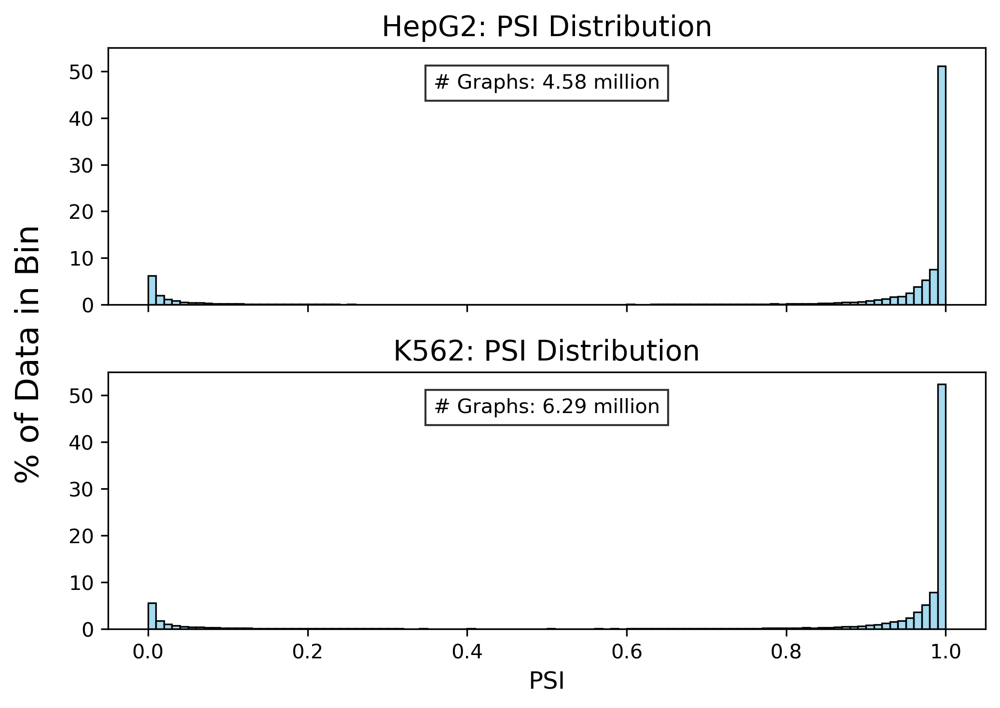

In [5]:
analyzer.plot_psi_distribution_per_cell_line()

<h1 style="color: teal; font-weight: bold; font-size: 48px;">RBP Binding Heatmaps</h1>

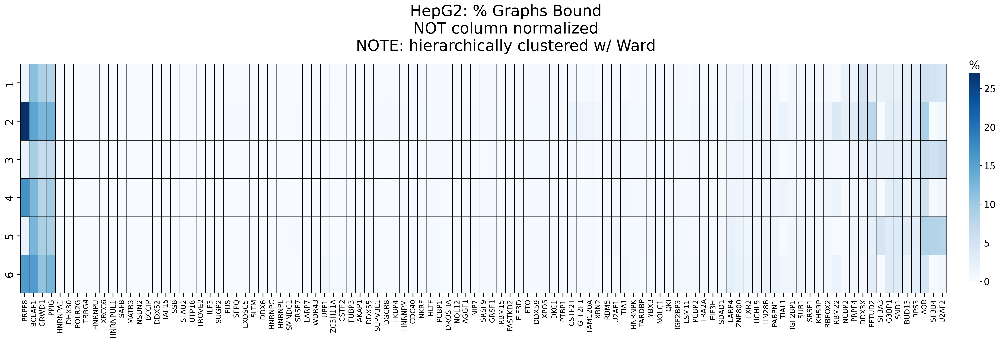

2026-02-20 17:26:09.430 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['TBRG4']


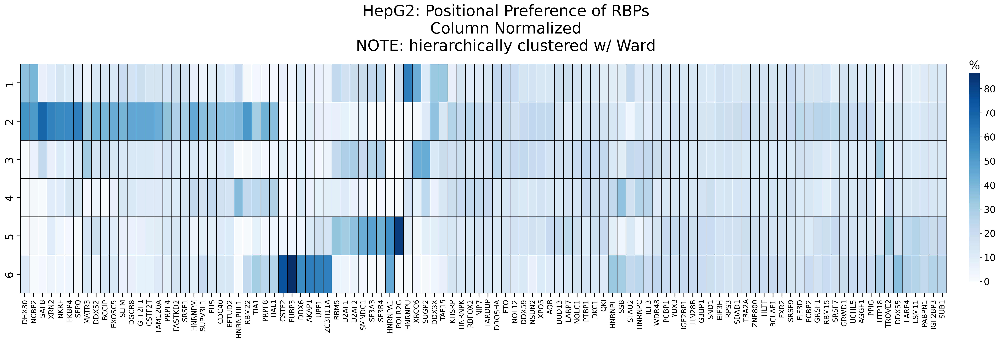

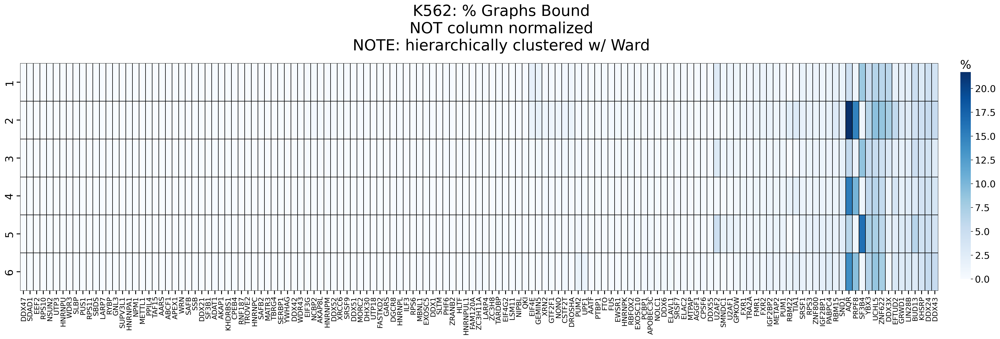

2026-02-20 17:26:15.784 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['SBDS']


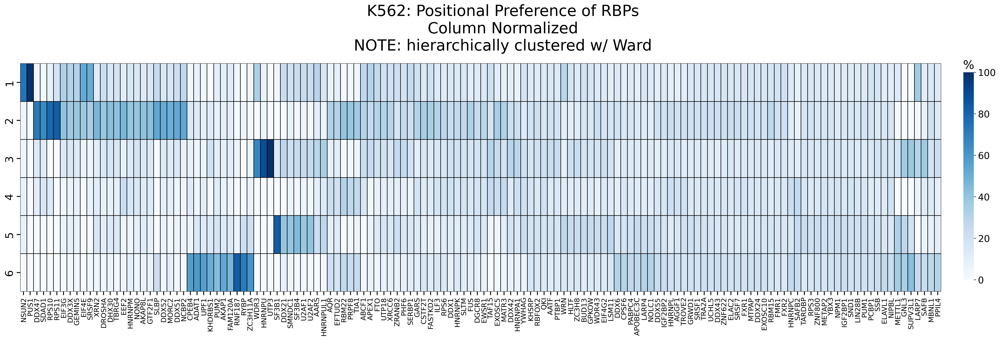

In [6]:
analyzer.plot_entire_dataset_RBP_heatmaps()

2026-02-20 17:26:18.665 | INFO     | 1_binding_analyzer:stratify_data_by_PSI_bins:318 - Stratifying data by PSI bins...
2026-02-20 17:26:20.571 | INFO     | 1_binding_analyzer:stratify_data_by_PSI_bins:330 - HepG2 - PSI bin 'PSI < 0.1': Shape -- (572935, 651)
2026-02-20 17:26:20.572 | INFO     | 1_binding_analyzer:stratify_data_by_PSI_bins:330 - HepG2 - PSI bin '0.1 <= PSI <= 0.9': Shape -- (491122, 651)
2026-02-20 17:26:20.572 | INFO     | 1_binding_analyzer:stratify_data_by_PSI_bins:330 - HepG2 - PSI bin 'PSI > 0.9': Shape -- (3512996, 651)
2026-02-20 17:26:23.696 | INFO     | 1_binding_analyzer:stratify_data_by_PSI_bins:330 - K562 - PSI bin 'PSI < 0.1': Shape -- (725313, 855)
2026-02-20 17:26:23.697 | INFO     | 1_binding_analyzer:stratify_data_by_PSI_bins:330 - K562 - PSI bin '0.1 <= PSI <= 0.9': Shape -- (671257, 855)
2026-02-20 17:26:23.697 | INFO     | 1_binding_analyzer:stratify_data_by_PSI_bins:330 - K562 - PSI bin 'PSI > 0.9': Shape -- (4894612, 855)
2026-02-20 17:26:23.697 |

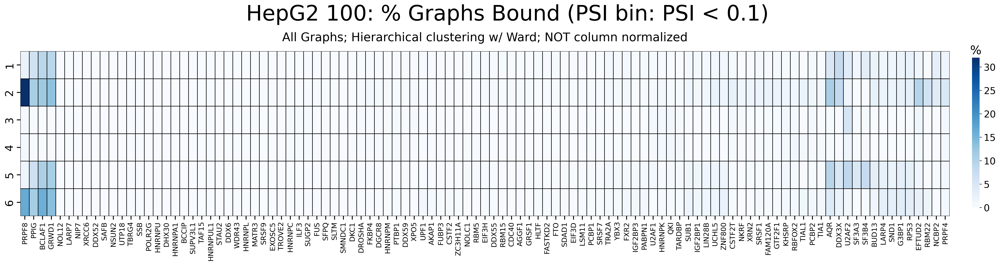

2026-02-20 17:26:26.331 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['DHX30', 'HNRNPA1', 'HNRNPU', 'POLR2G', 'SSB', 'TBRG4', 'UTP18']


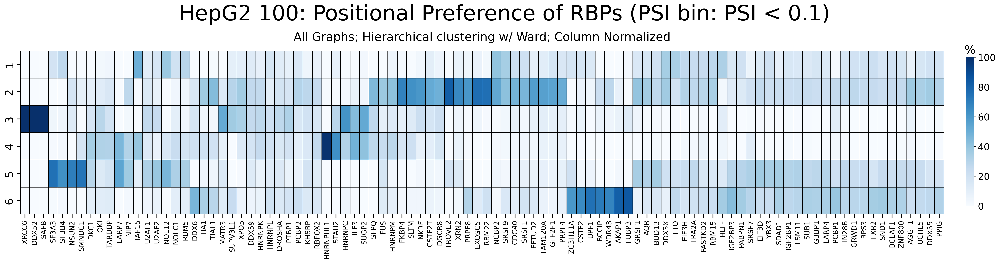

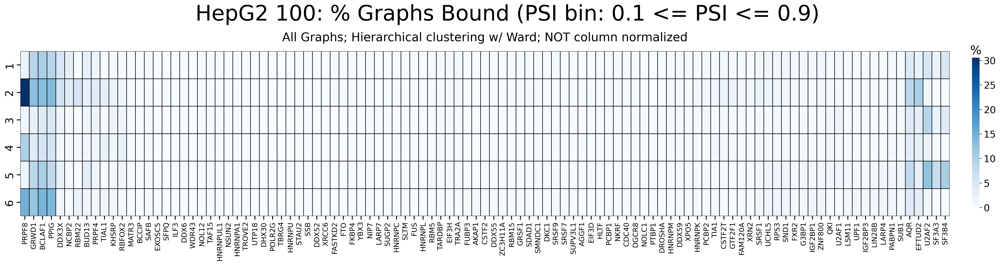

2026-02-20 17:26:31.541 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['TBRG4']


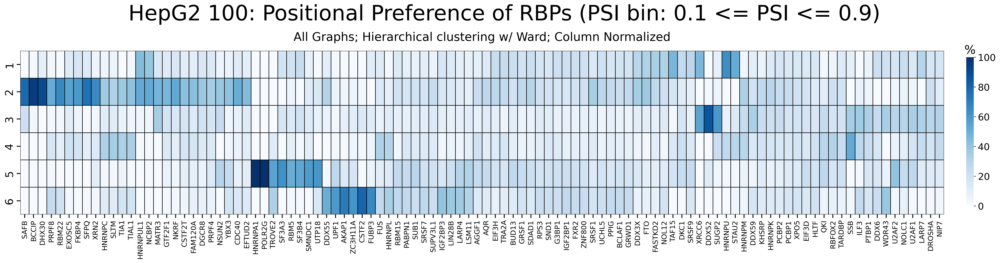

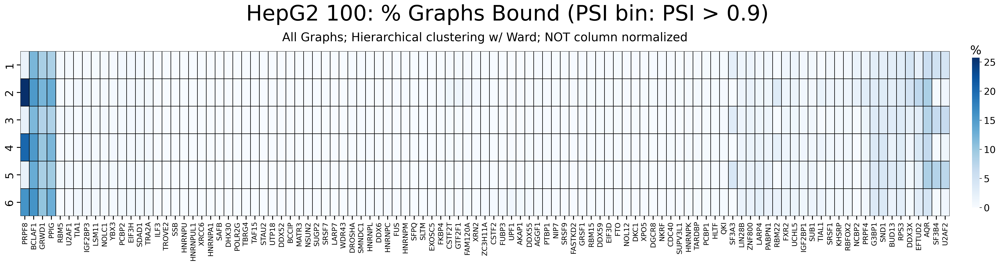

2026-02-20 17:26:36.447 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['TBRG4']


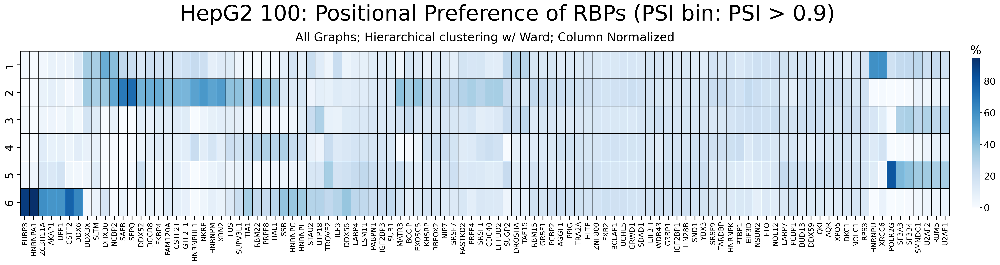

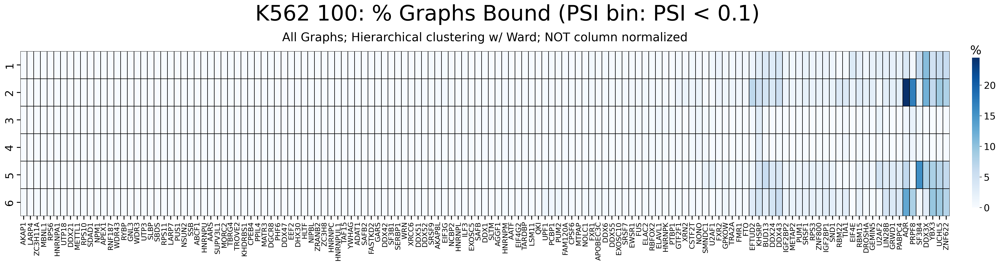

2026-02-20 17:26:41.627 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['LARP7', 'PUS1', 'RPS11', 'SBDS', 'SLBP', 'UTP3', 'WDR3']


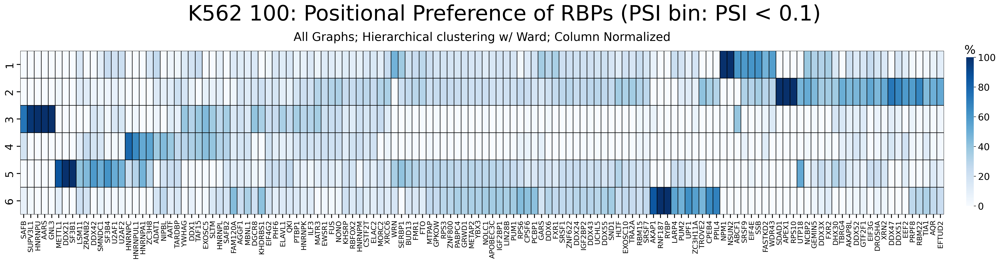

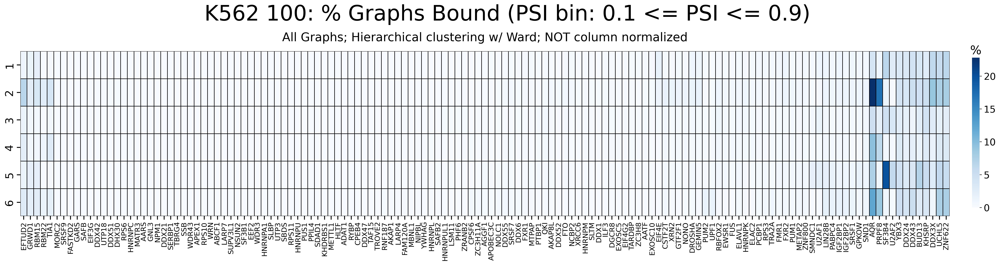

2026-02-20 17:26:47.002 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['HNRNPU', 'PUS1', 'RPS11', 'SBDS', 'UTP3']


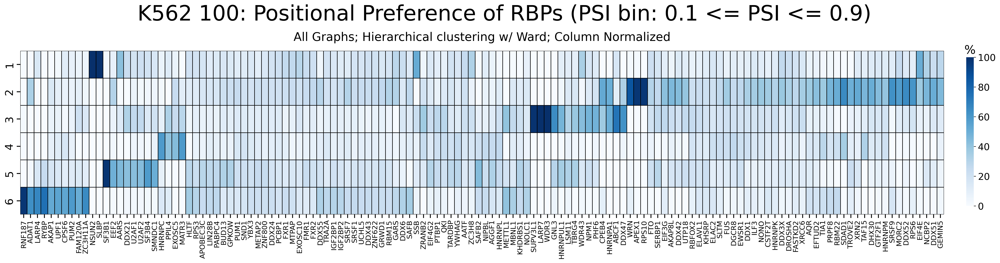

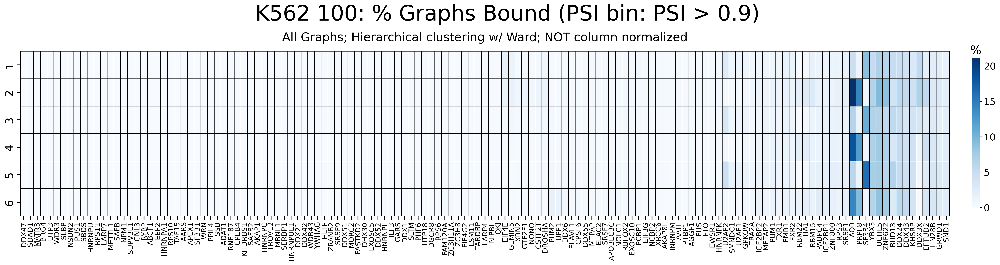

2026-02-20 17:26:53.690 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['SBDS']


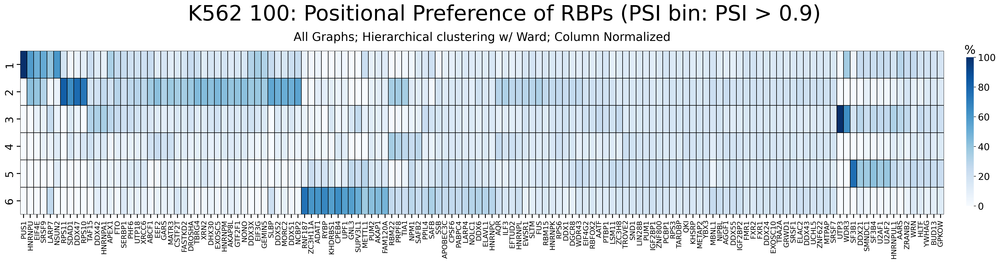

In [7]:
analyzer.plot_PSI_bin_stratified_RBP_heatmaps()

2026-02-20 17:26:56.460 | INFO     | 1_binding_analyzer:plot_knockdown_responsive_RBP_positional_preferences:407 - HepG2 - Original row count: 4577053, Filtered row count: 130615
2026-02-20 17:26:56.495 | INFO     | 1_binding_analyzer:plot_knockdown_responsive_RBP_positional_preferences:417 - Using unique 3-exon combinations for CTRLs. New row count: 8783


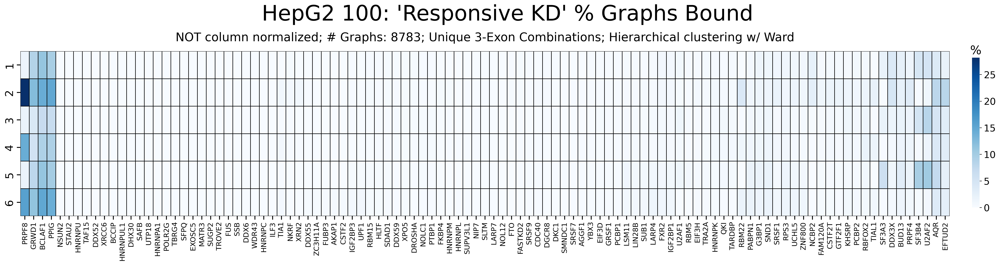

2026-02-20 17:26:59.070 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['POLR2G', 'TBRG4']


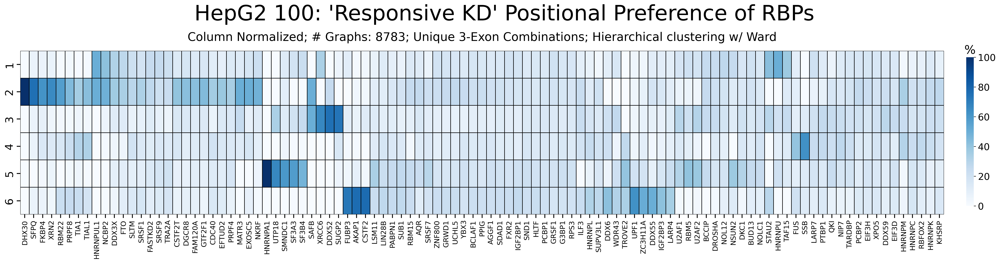

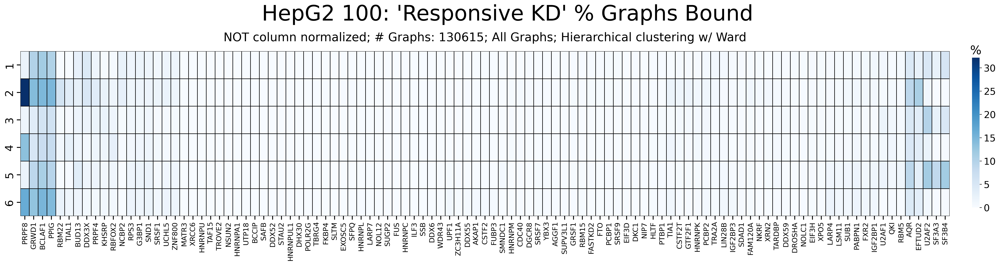

2026-02-20 17:27:03.893 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['TBRG4']


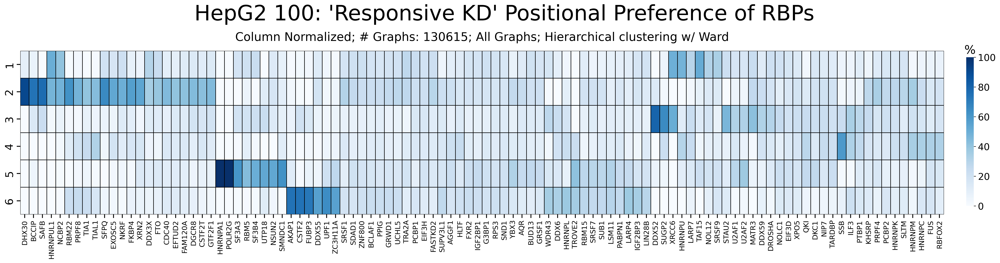

2026-02-20 17:27:06.193 | INFO     | 1_binding_analyzer:plot_knockdown_responsive_RBP_positional_preferences:407 - K562 - Original row count: 6291182, Filtered row count: 160650
2026-02-20 17:27:06.255 | INFO     | 1_binding_analyzer:plot_knockdown_responsive_RBP_positional_preferences:417 - Using unique 3-exon combinations for CTRLs. New row count: 11598


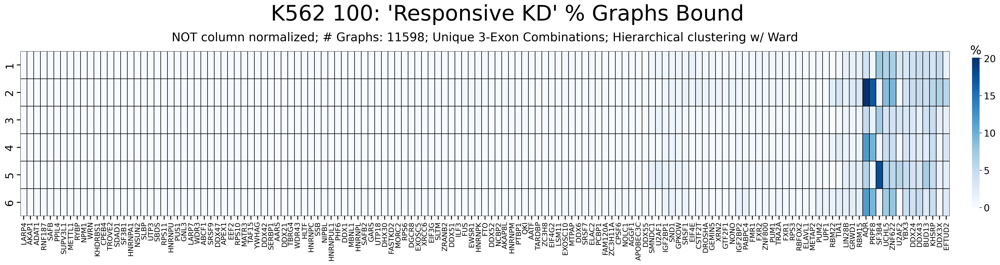

2026-02-20 17:27:09.189 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['HNRNPU', 'PUS1', 'RPS11', 'SBDS', 'UTP3']


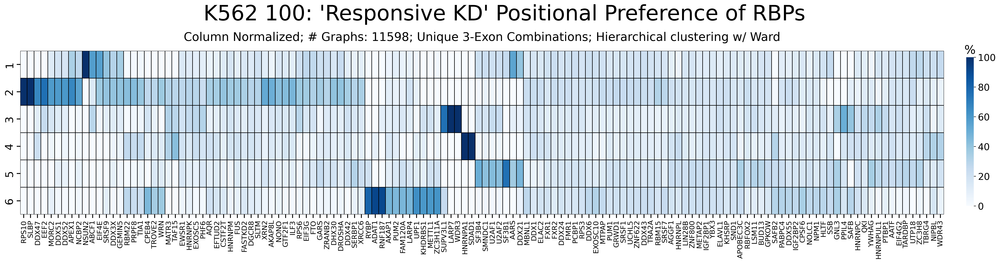

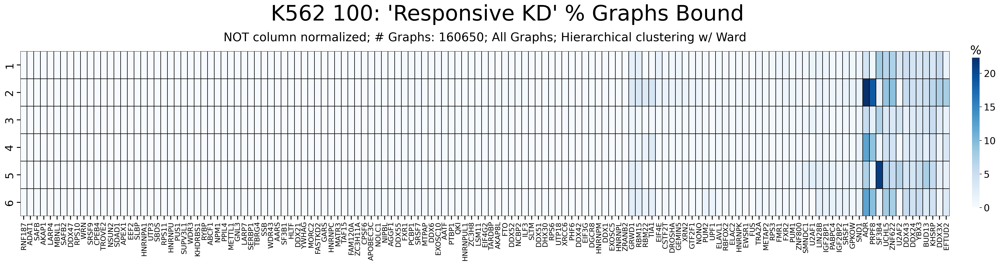

2026-02-20 17:27:14.700 | WARNING  | 1_binding_analyzer:convert_features_to_2d_table:237 - NULLS DETECTED when column normalizing: ['HNRNPU', 'PUS1', 'RPS11', 'SBDS', 'UTP3']


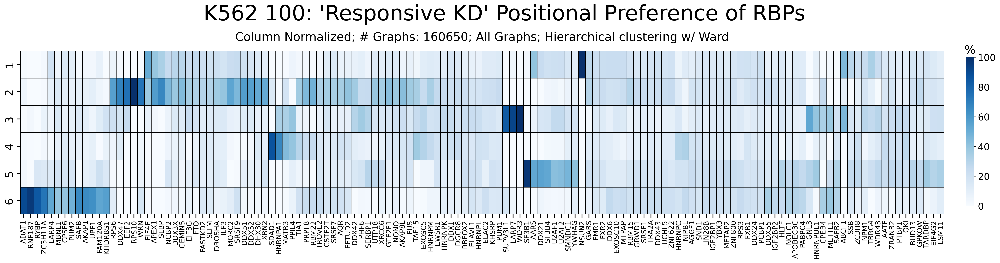

In [8]:
analyzer.plot_knockdown_responsive_RBP_positional_preferences()